### What is done in this notebook
- EDA of post join data two dataset(6months mainly)
  `air3m_join_stations_0308`
  `air6m_join_stations_0308`

### Reference
 - **Discussion of features(keep/drop)**
   - https://docs.google.com/spreadsheets/d/1wFra4oo6wdiy23kbUswi-f44yeCXxId_3uHuLfTqSvs/edit?usp=sharing
 
 - Screen shot of data profile(distribution of each feature)
   - https://docs.google.com/document/d/1ZEj5TNxJNUzT-8MExU399fN4z5IQU5HDOSv-AgbAvmA/edit?usp=sharing

# 0. Preparation

In [0]:
# Put at the top of any notebooks for storing in blob

from pyspark.sql.functions import col, max

blob_container = "team06" # The name of your container created in https://portal.azure.com
storage_account = "apatel" # The name of your Storage account created in https://portal.azure.com
secret_scope = "team06" # The name of the scope created in your local computer using the Databricks CLI
secret_key = "team06" # The name of the secret key created in your local computer using the Databricks CLI 
blob_url = f"wasbs://{blob_container}@{storage_account}.blob.core.windows.net"
mount_path = "/mnt/mids-w261"

In [0]:
!pip install geopandas
!conda install python=3 geopandas
!conda install descartes
!conda install mapclassify
!conda install contextily
!pip install folium

Requirement already satisfied: geopandas in /databricks/python3/lib/python3.8/site-packages (0.10.2)
Requirement already satisfied: fiona>=1.8 in /databricks/python3/lib/python3.8/site-packages (from geopandas) (1.8.21)
Requirement already satisfied: shapely>=1.6 in /databricks/python3/lib/python3.8/site-packages (from geopandas) (1.8.1.post1)
Requirement already satisfied: pyproj>=2.2.0 in /databricks/python3/lib/python3.8/site-packages (from geopandas) (3.3.0)
Requirement already satisfied: pandas>=0.25.0 in /databricks/python3/lib/python3.8/site-packages (from geopandas) (1.2.4)
Requirement already satisfied: six>=1.7 in /databricks/python3/lib/python3.8/site-packages (from fiona>=1.8->geopandas) (1.15.0)
Requirement already satisfied: setuptools in /usr/local/lib/python3.8/dist-packages (from fiona>=1.8->geopandas) (52.0.0)
Requirement already satisfied: click>=4.0 in /databricks/python3/lib/python3.8/site-packages (from fiona>=1.8->geopandas) (8.1.1)
Requirement already satisfied: certifi in /databricks/python3/lib/python3.8/site-packages (from fiona>=1.8->geopandas) (2020.12.5)
Requirement already satisfied: munch in /databricks/python3/lib/python3.8/site-packages (from fiona>=1.8->geopandas) (2.5.0)
Requirement already satisfied: cligj>=0.5 in /databricks/python3/lib/python3.8/site-packages (from fiona>=1.8->geopandas) (0.7.2)
Requirement already satisfied: click-plugins>=1.0 in /databricks/python3/lib/python3.8/site-packages (from fiona>=1.8->geopandas) (1.1.1)
Requirement already satisfied: attrs>=17 in /databricks/python3/lib/python3.8/site-packages (from fiona>=1.8->geopandas) (20.3.0)
Requirement already satisfied: pytz>=2017.3 in /databricks/python3/lib/python3.8/site-packages (from pandas>=0.25.0->geopandas) (2020.5)
Requirement already satisfied: numpy>=1.16.5 in /databricks/python3/lib/python3.8/site-packages (from pandas>=0.25.0->geopandas) (1.19.2)
Requirement already satisfied: python-dateutil>=2.7.3 in /databricks/python3/lib/python3.8/site-packages (from pandas>=0.25.0->geopandas) (2.8.1)
/bin/bash: conda: command not found
/bin/bash: conda: command not found
/bin/bash: conda: command not found
/bin/bash: conda: command not found
Requirement already satisfied: folium in /databricks/python3/lib/python3.8/site-packages (0.12.1.post1)
Requirement already satisfied: branca>=0.3.0 in /databricks/python3/lib/python3.8/site-packages (from folium) (0.4.2)
Requirement already satisfied: requests in /databricks/python3/lib/python3.8/site-packages (from folium) (2.25.1)
Requirement already satisfied: numpy in /databricks/python3/lib/python3.8/site-packages (from folium) (1.19.2)
Requirement already satisfied: jinja2>=2.9 in /databricks/python3/lib/python3.8/site-packages (from folium) (2.11.3)
Requirement already satisfied: MarkupSafe>=0.23 in /databricks/python3/lib/python3.8/site-packages (from jinja2>=2.9->folium) (1.1.1)
Requirement already satisfied: certifi>=2017.4.17 in /databricks/python3/lib/python3.8/site-packages (from requests->folium) (2020.12.5)
Requirement already satisfied: chardet<5,>=3.0.2 in /databricks/python3/lib/python3.8/site-packages (from requests->folium) (4.0.0)
Requirement already satisfied: urllib3<1.27,>=1.21.1 in /databricks/python3/lib/python3.8/site-packages (from requests->folium) (1.25.11)
Requirement already satisfied: idna<3,>=2.5 in /databricks/python3/lib/python3.8/site-packages (from requests->folium) (2.10)

In [0]:
!pip install --upgrade pip

Requirement already satisfied: pip in /databricks/python3/lib/python3.8/site-packages (22.0.4)

In [0]:
from pyspark.sql.functions import col
import pandas as pd
import numpy as np
import os

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.pyplot as plt
import ast

import geopandas as gpd
import folium
import contextily as contextily


In [0]:
df_5yr_join = spark.read.parquet(f'{blob_url}/flights_all_feats_and_imputed_weather_v3_26')

In [0]:
display(df_5yr_join)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,CANCELLED,ACTUAL_ELAPSED_TIME,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,LATE_AIRCRAFT_DELAY,ORI_IATA,ORI_station_id,ORI_station_lat,ORI_station_lon,ORI_airport_lat,ORI_airport_lon,ORI_elevation,ORI_dist_airp_sta,DEST_IATA,DEST_station_id,DEST_station_lat,DEST_station_lon,DEST_airport_lat,DEST_airport_lon,DEST_elevation,DEST_dist_airp_sta,CRS_DEP_HRS,CRS_DEP_MINS,CRS_DEP_TIME_STR,CRS_DEP_DT_STR,CRS_DEP_DATETIME,iata_code,ORI_timezone,CRS_DEP_DATETIME_UTC,CRS_DEP_DATETIME_UTC_END,CRS_DEP_DATETIME_UTC_START,STATION,DATE,LATITUDE,LONGITUDE,ELEVATION,REPORT_TYPE,DEST_timezone,DEP_HRS,DEP_MINS,DEP_TIME_STR,DEP_DT_STR,DEP_DATETIME,ARR_DATETIME_ACTUAL_UTC,late_night,daytime,evening,region_name,new_england,mid_atlantic,south,midwest,southwest,west,pacific_islands,atlantic_islands,spring,summer,autumn,winter,dep_date,weekend_or_holiday,flightID,ID,previous_flight_delay_status,previous_flight_dep_time,time_between_departures_min,valid_dep_delay,prior_dep_delayed,previous_DEP_DELAY_NEW_value,previous_DEP_DELAY_NEW,previous_flight_arrdelay_status,previous_flight_arr_time,time_between_arrival_and_end_min,valid_arr_delay,prior_arr_delayed,previous_ARR_DELAY_NEW_value,previous_ARR_DELAY_NEW,prev_arrival_airport,plane_is_here,avg_carrier_delay_24hrs,flights_sch_Today_ORIGIN,flights_sch_Today_DEST,avg_ori_airport_delay_24hrs,year_quarter,quarter_enum,quarter_enum_prev,month_seq_index,wnd_2_wind_obs_type,wnd_3_wind_sp_rate,cig_0_height,vis_0_distance,slp_0_day_avg,tmp_0_air_temp,dew_0_point_temp,ma1_0_altimeter_setting_rate,ma1_2_station_pressure_rate,gd1_3_sky_cover_height,WND_3_wind_speed,CIG_0_sky_ceiling_height,VIS_0_visibility_dist,SLP_0_avg_station_press,TMP_0_air_temperature,DEW_0_dew_pt_temp,MA1_0_altimeter_set_rate,MA1_2_station_pres_rate,OC1_0_wind_gust_spd_rate_imp,GD1_3_cloud_height,AA1_1_liquid_precip,AA3_1_liquid_precip,gd1_0_sky_coverage,au2_4_extreme_wind_weather,mv1_0_sand_dust_near,mv1_0_thunder_rain_near,aw1_mw1_0_smoke_haze_dust,aw1_mw1_0_fog,aw1_mw1_0_rain_drizzle,aw1_mw1_0_freezing_rain_drizzle,aw1_mw1_0_snow,aw1_mw1_0_hail_or_ice,aw1_mw1_0_thunderstorm,aw1_mw1_0_tornado,SLP_0_avg_station_press_imp,WND_3_wind_speed_imp,CIG_0_sky_ceiling_height_imp,VIS_0_visibility_dist_imp,TMP_0_air_temperature_imp,DEW_0_dew_pt_temp_imp,MA1_0_altimeter_set_rate_imp,MA1_2_station_pres_rate_imp,GD1_3_cloud_height_imp
2018,1,2,1,4,2018-02-01,AA,19805,N721UW,2070,10397,1039707,ATL,GA,13,Georgia,11057,1105703,CLT,NC,37,North Carolina,535,528,-7.0,0.0,0.0,-1,0001-0559,646,640,-6.0,0.0,0.0,0.0,72.0,226.0,1,null,null,null,null,ATL,72219013874,33.63,-84.442,33.6367,-84.428101,1026.0,1.4868906335816192,CLT,72314013881,35.224,-80.955,35.2140007,-80.94309998,748.0,1.550757753493052,5,35,05:35,2018-02-01 05:35,2018-02-01T05:35:00.000+0000,ATL,America/New_York,2018-02-01T10:35:00.000+0000,2018-02-01T08:35:00.000+0000,2018-02-01T06:35:00.000+0000,72219013874,2018-02-01T07:52:00.000+0000,33.6301,-84.4418,307.8,FM-15,America/New_York,05,28,05:28,2018-02-01 05:28,2018-02-01T05:28:00.000+0000,2018-02-01T11:40:00.000+0000,1,0,0,south,0,0,1,0,0,0,0,0,0,0,0,1,2018-02-01,0,42950192658,AAN721UWATL2018-02-01535,0.0,2018-02-01T01:20:00.000+0000,555.0,yes,0,0.0,0.0,0.0,2018-02-01T03:29:00.000+0000,426.0,yes,0,0.0,0.0,ATL,1,0.06,1080,625,0.05,2018-1,12,11,37,N,0021,22000,016093,10221,+0044,-0044,10220,09847,+01067,21,22000,16093,10221,44,-44,10220,9847,0,1067,0,0,0,0,0,0,0,0,0,0,0,0,0,0,10221.0,21.0,22000.0,16093.0,44.0,-44.0,10220.0,9847.0,1067.0
2018,1,2,1,4,2018-02-01,YV,20378,N86316,6098,10397,1039707,ATL,GA,

# 1. GeoPandas Visualization - distribution of airport and station in dataset

In [0]:
# need original airline full data to visualize international airport
df_airlines_original = spark.read.parquet("/mnt/mids-w261/datasets_final_project/parquet_airlines_data/*")
df_airlines_original_6m = spark.read.parquet("/mnt/mids-w261/datasets_final_project/parquet_airlines_data_6m/*")

df_airport_country = spark.read.parquet(f"{blob_url}/globalairportdatabase_raw_data")


#parquet_airlines_data/
display(df_airlines_original)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_AIRPORT,DIV2_AIRPORT_ID,DIV2_AIRPORT_SEQ_ID,DIV2_WHEELS_ON,DIV2_TOTAL_GTIME,DIV2_LONGEST_GTIME,DIV2_WHEELS_OFF,DIV2_TAIL_NUM,DIV3_AIRPORT,DIV3_AIRPORT_ID,DIV3_AIRPORT_SEQ_ID,DIV3_WHEELS_ON,DIV3_TOTAL_GTIME,DIV3_LONGEST_GTIME,DIV3_WHEELS_OFF,DIV3_TAIL_NUM,DIV4_AIRPORT,DIV4_AIRPORT_ID,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_AIRPORT_SEQ_ID,DIV5_WHEELS_ON,DIV5_TOTAL_GTIME,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,DIV5_TAIL_NUM
2019,3,7,31,3,2019-07-31,WN,19393,WN,N908WN,555,10693,1069302,30693,BNA,"Nashville, TN",TN,47,Tennessee,54,13487,1348702,31650,MSP,"Minneapolis, MN",MN,27,Minnesota,63,1045,1058,13.0,13.0,0.0,0,1000-1059,10.0,1108,1254,4.0,1255,1258,3.0,3.0,0.0,0,1200-1259,0.0,null,0.0,130.0,120.0,106.0,1.0,695.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2019,3,7,31,3,2019-07-31,WN,19393,WN,N415WN,2300,10693,1069302,30693,BNA,"Nashville, TN",TN,47,Tennessee,54,13487,1348702,31650,MSP,"Minneapolis, MN",MN,27,Minnesota,63,1815,1813,-2.0,0.0,0.0,-1,1800-1859,9.0,1822,2006,11.0,2020,2017,-3.0,0.0,0.0,-1,2000-2059,0.0,null,0.0,125.0,124.0,104.0,1.0,695.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2019,3,7,31,3,2019-07-31,WN,19393,WN,N966WN,443,10693,1069302,30693,BNA,"Nashville, TN",TN,47,Tennessee,54,13495,1349505,33495,MSY,"New Orleans, LA",LA,22,Louisiana,72,1945,1953,8.0,8.0,0.0,0,1900-1959,12.0,2005,2110,2.0,2105,2112,7.0,7.0,0.0,0,2100-2159,0.0,null,0.0,80.0,79.0,65.0,1.0,471.0,2,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2019,3,7,31,3,2019-07-31,WN,19393,WN,N403WN,1371,10693,1069302,30693,BNA,"Nashville, TN",TN,47,Tennessee,54,13495,1349505,33495,MSY,"New Orleans, LA",LA,22,Louisiana,72,1330,1337,7.0,7.0,0.0,0,1300-1359,9.0,1346,1451,4.0,1505,1455,-10.0,0.0,0.0,-1,1500-1559,0.0,null,0.0,95.0,78.0,65.0,1.0,471.0,2,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2019,3,7,31,3,2019-07-31,WN,19393,WN,N423WN,2483,10693,1069302,30693,BNA,"Nashville, TN",TN,47,Tennessee,54,13495,1349505,33495,MSY,"New Orleans, LA",LA,22,Louisian

In [0]:
openflights_df = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/mattslyons@berkeley.edu/airports_amended.csv")

display(openflights_df)

airport_id,airport_name,airport_city,airport_country,IATA_code,ICAO_code,airport_lat,airport_lon,altitude,UTC_offset,DST,time_zone
1,Goroka Airport,Goroka,Papua New Guinea,GKA,AYGA,-6.081689835,145.3919983,5282,10,U,Pacific/Port_Moresby
2,Madang Airport,Madang,Papua New Guinea,MAG,AYMD,-5.207079887,145.7890015,20,10,U,Pacific/Port_Moresby
3,Mount Hagen Kagamuga Airport,Mount Hagen,Papua New Guinea,HGU,AYMH,-5.826789856,144.2960052,5388,10,U,Pacific/Port_Moresby
4,Nadzab Airport,Nadzab,Papua New Guinea,LAE,AYNZ,-6.569803,146.725977,239,10,U,Pacific/Port_Moresby
5,Port Moresby Jacksons International Airport,Port Moresby,Papua New Guinea,POM,AYPY,-9.443380356,147.2200012,146,10,U,Pacific/Port_Moresby
6,Wewak International Airport,Wewak,Papua New Guinea,WWK,AYWK,-3.583830118,143.6690063,19,10,U,Pacific/Port_Moresby
7,Narsarsuaq Airport,Narssarssuaq,Greenland,UAK,BGBW,61.16049957,-45.42599869,112,-3,E,America/Godthab
8,Godthaab / Nuuk Airport,Godthaab,Greenland,GOH,BGGH,64.19090271,-51.67810059,283,-3,E,America/Godthab
9,Kangerlussuaq Airport,Sondrestrom,Greenland,SFJ,BGSF,67.0122219,-50.71160316,165,-3,E,America/Godthab
10,Thule Air Base,Thule,Greenland,THU,BGTL,76.53119659,-68.70320129,251,-4,E,America/Thule


In [0]:
# airports in 6 month data 
origin_airport_6m = df_airlines_original_6m.groupby(['ORIGIN']).count()
dest_airport_6m = df_airlines_original_6m.groupby(['DEST']).count()

origin_airport_6m.show()

+------+------+
ORIGIN| count|
+------+------+
 ATL|186135|
 ORD|151692|
+------+------+

In [0]:
dest_airport_6m.count()

Out[41]: 196

In [0]:
origin_airport_full = df_airlines_original.groupby(['ORIGIN']).count()
dest_airport_full = df_airlines_original.groupby(['DEST']).count()

In [0]:
# airports in full data 
# 371 airports for origin
display(origin_airport_full)

ORIGIN,count
BGM,7896
DLG,822
PSE,8062
INL,6354
MSY,493798
PPG,1196
GEG,112870
DRT,1674
BUR,253598
SNA,415008


In [0]:
# 369 airports for destination
display(dest_airport_full)

DEST,count
BGM,7898
DLG,822
PSE,8088
INL,6354
MSY,493814
PPG,1196
GEG,112874
DRT,1676
BUR,253622
SNA,415144


### Join origin/destination with LAT LONG

In [0]:
# Every airport was captured by openflights_df
origin_airport_full_geo = origin_airport_full.join(openflights_df, (origin_airport_full.ORIGIN == openflights_df.IATA_code))

# origin_airport_full_geo = origin_airport_full.join(df_airportID_country, (origin_airport_full.ORIGIN == df_airportID_country.IATA))
display(origin_airport_full_geo)

ORIGIN,count,airport_id,airport_name,airport_city,airport_country,IATA_code,ICAO_code,airport_lat,airport_lon,altitude,UTC_offset,DST,time_zone
BGM,7896,4129,Greater Binghamton/Edwin A Link field,Binghamton,United States,BGM,KBGM,42.20869827,-75.97979736,1636,-5,A,America/New_York
PSE,8062,2889,Mercedita Airport,Ponce,Puerto Rico,PSE,TJPS,18.00830078,-66.56300354,29,-4,U,America/Puerto_Rico
INL,6354,3535,Falls International Airport,International Falls,United States,INL,KINL,48.56620026,-93.40309906,1185,-6,A,America/Chicago
DLG,822,3460,Dillingham Airport,Dillingham,United States,DLG,PADL,59.04470062,-158.5050049,81,-9,A,America/Anchorage
MSY,493798,3861,Louis Armstrong New Orleans International Airport,New Orleans,United States,MSY,KMSY,29.99340057,-90.25800323,4,-6,A,America/Chicago
PPG,1196,1970,Pago Pago International Airport,Pago Pago,American Samoa,PPG,NSTU,-14.33100033,-170.7100067,32,-11,U,Pacific/Pago_Pago
GEG,112870,3467,Spokane International Airport,Spokane,United States,GEG,KGEG,47.61989975,-117.5339966,2376,-8,A,America/Los_Angeles
DRT,1674,3792,Del Rio International Airport,Del Rio,United States,DRT,KDRT,29.37420082,-100.927002,1002,-6,A,America/Chicago
SNA,415008,3867,John Wayne Airport-Orange County Airport,Santa Ana,United States,SNA,KSNA,33.67570114,-117.8679962,56,-8,A,America/Los_Angeles
BUR,253598,3644,Bob Hope Airport,Burbank,United States,BUR,KBUR,34.20069885,-118.3590012,778,-8,A,America/Los_Angeles


In [0]:
dest_airport_full_geo = dest_airport_full.join(openflights_df, (dest_airport_full.DEST == openflights_df.IATA_code))
display(dest_airport_full_geo)

DEST,count,airport_id,airport_name,airport_city,airport_country,IATA_code,ICAO_code,airport_lat,airport_lon,altitude,UTC_offset,DST,time_zone
BGM,7898,4129,Greater Binghamton/Edwin A Link field,Binghamton,United States,BGM,KBGM,42.20869827,-75.97979736,1636,-5,A,America/New_York
DLG,822,3460,Dillingham Airport,Dillingham,United States,DLG,PADL,59.04470062,-158.5050049,81,-9,A,America/Anchorage
PSE,8088,2889,Mercedita Airport,Ponce,Puerto Rico,PSE,TJPS,18.00830078,-66.56300354,29,-4,U,America/Puerto_Rico
INL,6354,3535,Falls International Airport,International Falls,United States,INL,KINL,48.56620026,-93.40309906,1185,-6,A,America/Chicago
MSY,493814,3861,Louis Armstrong New Orleans International Airport,New Orleans,United States,MSY,KMSY,29.99340057,-90.25800323,4,-6,A,America/Chicago
PPG,1196,1970,Pago Pago International Airport,Pago Pago,American Samoa,PPG,NSTU,-14.33100033,-170.7100067,32,-11,U,Pacific/Pago_Pago
GEG,112874,3467,Spokane International Airport,Spokane,United States,GEG,KGEG,47.61989975,-117.5339966,2376,-8,A,America/Los_Angeles
DRT,1676,3792,Del Rio International Airport,Del Rio,United States,DRT,KDRT,29.37420082,-100.927002,1002,-6,A,America/Chicago
BUR,253622,3644,Bob Hope Airport,Burbank,United States,BUR,KBUR,34.20069885,-118.3590012,778,-8,A,America/Los_Angeles
SNA,415144,3867,John Wayne Airport-Orange County Airport,Santa Ana,United States,SNA,KSNA,33.67570114,-117.8679962,56,-8,A,America/Los_Angeles


In [0]:
origin_airport_full_geo

Out[57]: DataFrame[ORIGIN: string, count: bigint, airport_id: string, airport_name: string, airport_city: string, airport_country: string, IATA_code: string, ICAO_code: string, airport_lat: string, airport_lon: string, altitude: string, UTC_offset: string, DST: string, time_zone: string]

### Create geo dataframe and plot the distribution of both station and airports

In [0]:
# select full data and convert to Pandas
# Create geo dataframe
#schools_gdf = gpd.GeoDataFrame(schools_df, geometry=gpd.points_from_xy(schools_df.X, schools_df.Y))

# all airport(origin)
origin_airport_full_geo = origin_airport_full_geo.toPandas()
gdf_origin_airport_full = gpd.GeoDataFrame(origin_airport_full_geo, geometry=gpd.points_from_xy(origin_airport_full_geo.airport_lon, origin_airport_full_geo.airport_lat))

# all airport(destination)
dest_airport_full_geo = dest_airport_full_geo.toPandas()
gdf_dest_airport_full =  gpd.GeoDataFrame(dest_airport_full_geo, geometry=gpd.points_from_xy(dest_airport_full_geo.airport_lon, dest_airport_full_geo.airport_lat))

# all station
stationid_full_geo = df_5yr_join.select('ORIGIN','ORI_station_id','ORI_station_lat','ORI_station_lon').groupby(['ORIGIN','ORI_station_id','ORI_station_lat','ORI_station_lon']).count()
stationid_full_geo = stationid_full_geo.toPandas()

gdf_stationid_full =  gpd.GeoDataFrame(stationid_full_geo, geometry=gpd.points_from_xy(stationid_full_geo.ORI_station_lon, stationid_full_geo.ORI_station_lat))
gdf_stationid_full

Out[58]:

,ORIGIN,ORI_station_id,ORI_station_lat,ORI_station_lon,count,geometry
0,TYS,72326013891,35.818,-83.986,54389,POINT (-83.98600 35.81800)
1,LAX,72295023174,33.938,-118.389,1070139,POINT (-118.38900 33.93800)
2,ADK,70454025704,51.883,-176.650,490,POINT (-176.65000 51.88300)
3,EVV,72432093817,38.044,-87.521,17396,POINT (-87.52100 38.04400)
4,CWA,72646594890,44.783,-89.667,8640,POINT (-89.66700 44.78300)
...,...,...,...,...,...,...
366,SUX,72557014943,42.391,-96.379,3116,POINT (-96.37900 42.39100)
367,PPG,91197521510,19.736,-156.049,1,POINT (-156.04900 19.73600)
368,JFK,74486094789,40.639,-73.762,539922,POINT (-73.76200 40.63900)
369,PAH,72435003816,37.056,-88.774,3913,POINT (-88.77400 37.05600)


In [0]:
# set CRS
gdf_origin_airport_full.crs = "epsg:4326"
gdf_dest_airport_full.crs = "epsg:4326"
gdf_stationid_full.crs = "epsg:4326"

### Prepare basis map

<class 'geopandas.geodataframe.GeoDataFrame'>, geometry
 pop_est ... geometry
0 920938 ... MULTIPOLYGON (((180.00000 -16.06713, 180.00000...
1 53950935 ... POLYGON ((33.90371 -0.95000, 34.07262 -1.05982...
2 603253 ... POLYGON ((-8.66559 27.65643, -8.66512 27.58948...
3 35623680 ... MULTIPOLYGON (((-122.84000 49.00000, -122.9742...
4 326625791 ... MULTIPOLYGON (((-122.84000 49.00000, -120.0000...

[5 rows x 6 columns]
Polygon 148
MultiPolygon 29
dtype: int64
Out[66]:

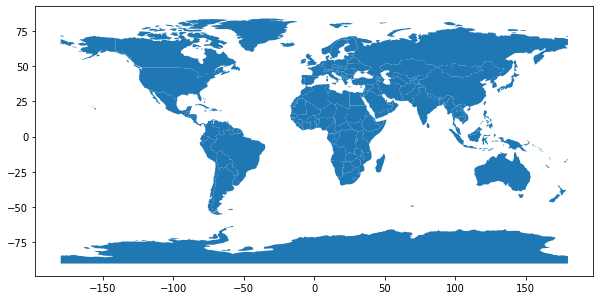

<AxesSubplot:>

In [0]:
gdf_world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
print(f"{type(gdf_world)}, {gdf_world.geometry.name}")

print(gdf_world.head())

print(gdf_world.geometry.geom_type.value_counts())
gdf_world.plot(figsize=(10,6))

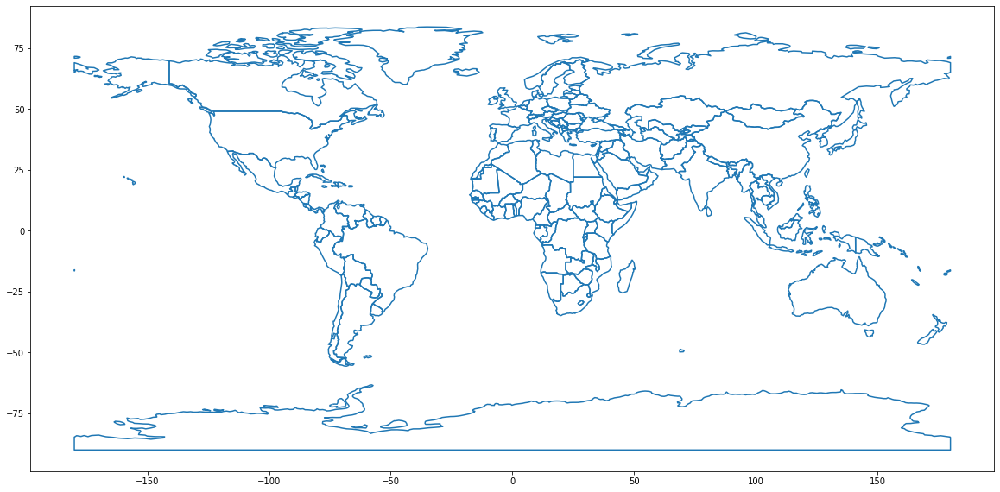

In [0]:
ax = df_world["geometry"].boundary.plot(figsize=(20,16))

In [0]:
gdf_world[gdf_world['continent']=='North America']

Out[68]:

,pop_est,continent,name,iso_a3,gdp_md_est,geometry
3,35623680,North America,Canada,CAN,1674000.0,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742..."
4,326625791,North America,United States of America,USA,18560000.0,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000..."
16,10646714,North America,Haiti,HTI,19340.0,"POLYGON ((-71.71236 19.71446, -71.62487 19.169..."
17,10734247,North America,Dominican Rep.,DOM,161900.0,"POLYGON ((-71.70830 18.04500, -71.68774 18.316..."
19,329988,North America,Bahamas,BHS,9066.0,"MULTIPOLYGON (((-78.98000 26.79000, -78.51000 ..."
22,57713,North America,Greenland,GRL,2173.0,"POLYGON ((-46.76379 82.62796, -43.40644 83.225..."
27,124574795,North America,Mexico,MEX,2307000.0,"POLYGON ((-117.12776 32.53534, -115.99135 32.6..."
33,3753142,North America,Panama,PAN,93120.0,"POLYGON ((-77.35336 8.67050, -77.47472 8.52429..."
34,4930258,North America,Costa Rica,CRI,79260.0,"POLYGON ((-82.54620 9.56613, -82.93289 9.47681..."
35,6025951,North America,Nicaragua,NIC,33550.0,"POLYGON ((-83.65561 10.93876, -83.89505 10.726..."


In [0]:
gdf_US = gdf_world.loc[gdf_world['name'] == 'United States of America'].copy().reset_index(drop=True)
gdf_US

Out[69]:

,pop_est,continent,name,iso_a3,gdp_md_est,geometry
0,326625791,North America,United States of America,USA,18560000.0,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000..."


Out[70]:

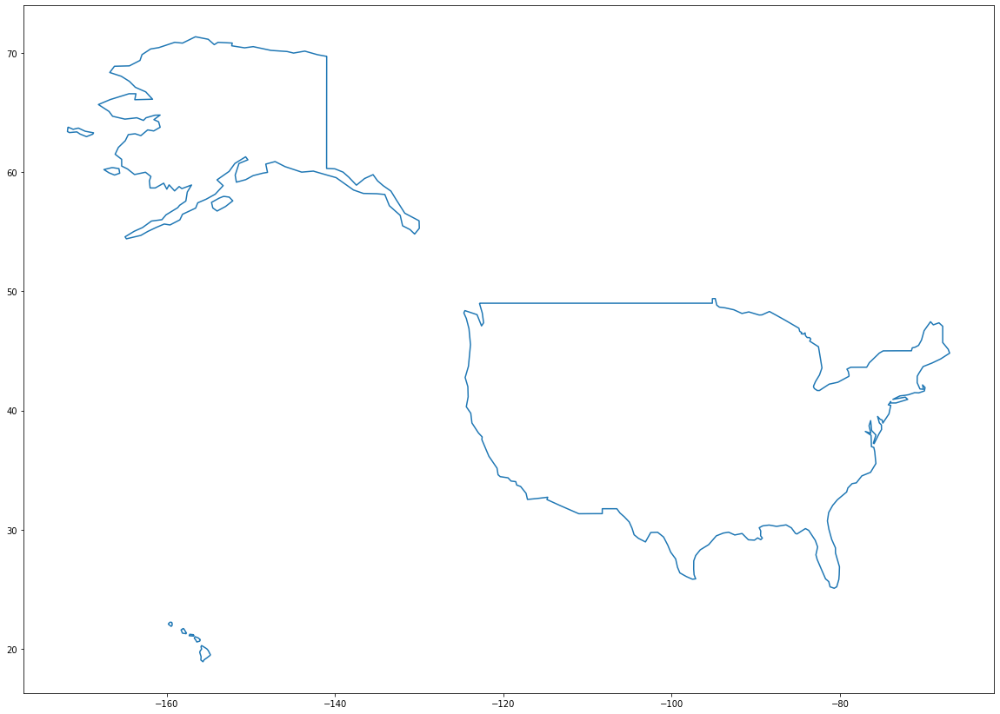

<AxesSubplot:>

In [0]:
gdf_US.boundary.plot(figsize=(20,16))

In [0]:
gdf_US

Out[71]:

,pop_est,continent,name,iso_a3,gdp_md_est,geometry
0,326625791,North America,United States of America,USA,18560000.0,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000..."


Out[72]:

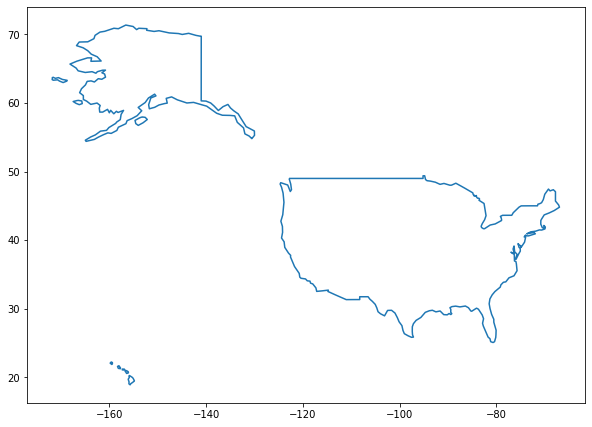

<AxesSubplot:>

In [0]:
gdf_US_2 = gdf_US.to_crs("epsg:4326")
gdf_US_2.boundary.plot(figsize=(10,10))

### Plot Airports and stations

In [0]:
# gdf_origin_airport_full 
# gdf_dest_airport_full
# gdf_stationid_full

### Available weather data cover most area that airports in the airline data locates

Out[74]:

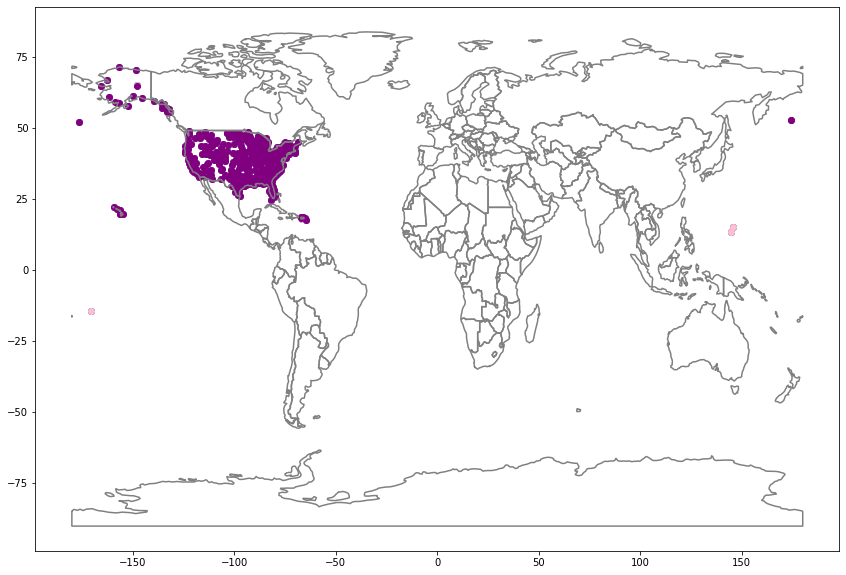

<AxesSubplot:>

In [0]:
fig, ax = plt.subplots(figsize=(15,10))
#gdf_US_2.plot(ax=ax)
df_world["geometry"].boundary.plot(ax=ax, color='grey')
gdf_origin_airport_full.plot(ax=ax, color='blue')
gdf_dest_airport_full.plot(ax=ax, color='pink')
gdf_stationid_full.plot(ax=ax, color='purple')

We could use of street map later for EDA

Out[75]:

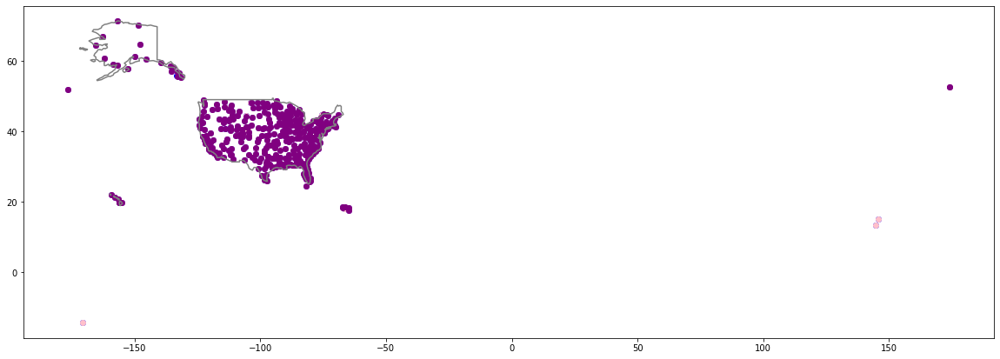

<AxesSubplot:>

In [0]:
fig, ax = plt.subplots(figsize=(20,20))
gdf_US_2.boundary.plot(ax=ax, color='grey')
gdf_origin_airport_full.plot(ax=ax, color='blue')
gdf_dest_airport_full.plot(ax=ax, color='pink')
gdf_stationid_full.plot(ax=ax, color='purple')

In [0]:
# string to float
gdf_origin_airport_full['airport_lon'] = gdf_origin_airport_full['airport_lon'].apply(lambda x: float(x))
gdf_origin_airport_full['airport_lat'] = gdf_origin_airport_full['airport_lat'].apply(lambda x: float(x))
gdf_dest_airport_full['airport_lon'] = gdf_dest_airport_full['airport_lon'].apply(lambda x: float(x))
gdf_dest_airport_full['airport_lat'] = gdf_dest_airport_full['airport_lat'].apply(lambda x: float(x))

In [0]:
gdf_origin_airport_nooutlier = gdf_origin_airport_full[(gdf_origin_airport_full['airport_lon'] < 100 )& (gdf_origin_airport_full['airport_lat'] > 0)]
gdf_dest_airport_nooutlier = gdf_dest_airport_full[(gdf_dest_airport_full['airport_lon'] < 100 )& (gdf_dest_airport_full['airport_lat'] > 0)]
gdf_stationid_nooutlier = gdf_stationid_full[(gdf_stationid_full['ORI_station_lon'] < 100 ) & (gdf_stationid_full['ORI_station_lat'] > 0)]

# recreate geo dataframe
# all airport(origin)
gdf_origin_airport_full =  gpd.GeoDataFrame(gdf_origin_airport_nooutlier, geometry=gpd.points_from_xy(gdf_origin_airport_nooutlier.airport_lon, gdf_origin_airport_nooutlier.airport_lat))

# all airport(destination)
gdf_dest_airport_full =  gpd.GeoDataFrame(gdf_dest_airport_nooutlier, geometry=gpd.points_from_xy(gdf_dest_airport_nooutlier.airport_lon, gdf_dest_airport_nooutlier.airport_lat))

# all airport(destination)
gdf_stationid_nooutlier =  gpd.GeoDataFrame(gdf_stationid_nooutlier, geometry=gpd.points_from_xy(gdf_stationid_nooutlier.ORI_station_lon, gdf_stationid_nooutlier.ORI_station_lat))

gdf_origin_airport_full.crs = "epsg:4326"
gdf_dest_airport_full.crs = "epsg:4326"
gdf_stationid_nooutlier.crs = "epsg:4326"

In [0]:
gdf_stationid_full

Out[82]:

,ORIGIN,ORI_station_id,ORI_station_lat,ORI_station_lon,count,geometry
0,TYS,72326013891,35.818,-83.986,54389,POINT (-83.98600 35.81800)
1,LAX,72295023174,33.938,-118.389,1070139,POINT (-118.38900 33.93800)
2,ADK,70454025704,51.883,-176.650,490,POINT (-176.65000 51.88300)
3,EVV,72432093817,38.044,-87.521,17396,POINT (-87.52100 38.04400)
4,CWA,72646594890,44.783,-89.667,8640,POINT (-89.66700 44.78300)
...,...,...,...,...,...,...
366,SUX,72557014943,42.391,-96.379,3116,POINT (-96.37900 42.39100)
367,PPG,91197521510,19.736,-156.049,1,POINT (-156.04900 19.73600)
368,JFK,74486094789,40.639,-73.762,539922,POINT (-73.76200 40.63900)
369,PAH,72435003816,37.056,-88.774,3913,POINT (-88.77400 37.05600)


In [0]:
gdf_origin_airport_full

Out[83]:

,ORIGIN,count,airport_id,airport_name,airport_city,airport_country,IATA_code,ICAO_code,airport_lat,airport_lon,altitude,UTC_offset,DST,time_zone,geometry
0,BGM,7896,4129,Greater Binghamton/Edwin A Link field,Binghamton,United States,BGM,KBGM,42.208698,-75.979797,1636,-5,A,America/New_York,POINT (-75.97980 42.20870)
1,PSE,8062,2889,Mercedita Airport,Ponce,Puerto Rico,PSE,TJPS,18.008301,-66.563004,29,-4,U,America/Puerto_Rico,POINT (-66.56300 18.00830)
2,INL,6354,3535,Falls International Airport,International Falls,United States,INL,KINL,48.566200,-93.403099,1185,-6,A,America/Chicago,POINT (-93.40310 48.56620)
3,DLG,822,3460,Dillingham Airport,Dillingham,United States,DLG,PADL,59.044701,-158.505005,81,-9,A,America/Anchorage,POINT (-158.50500 59.04470)
4,MSY,493798,3861,Louis Armstrong New Orleans International Airport,New Orleans,United States,MSY,KMSY,29.993401,-90.258003,4,-6,A,America/Chicago,POINT (-90.25800 29.99340)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
366,EFD,2,3572,Ellington Airport,Houston,United States,EFD,KEFD,29.607300,-95.158798,32,-6,A,America/Chicago,POINT (-95.15880 29.60730)
367,CLD,1282,4088,Mc Clellan-Palomar Airport,Carlsbad,United States,CLD,KCRQ,33.128300,-117.279999,331,-8,A,America/Los_Angeles,POINT (-117.28000 33.12830)
368,ENV,2,3451,Wendover Airport,Wendover,United States,ENV,KENV,40.718700,-114.030998,4237,-7,A,America/Denver,POINT (-114.03100 40.71870)
369,YNG,4,3881,Youngstown Warren Regional Airport,Youngstown,United States,YNG,KYNG,41.260700,-80.679100,1192,-5,A,America/New_York,POINT (-80.67910 41.26070)


In [0]:
gdf_origin_airport_full[gdf_origin_airport_full['airport_lon'] < 100]

Out[84]:

,ORIGIN,count,airport_id,airport_name,airport_city,airport_country,IATA_code,ICAO_code,airport_lat,airport_lon,altitude,UTC_offset,DST,time_zone,geometry
0,BGM,7896,4129,Greater Binghamton/Edwin A Link field,Binghamton,United States,BGM,KBGM,42.208698,-75.979797,1636,-5,A,America/New_York,POINT (-75.97980 42.20870)
1,PSE,8062,2889,Mercedita Airport,Ponce,Puerto Rico,PSE,TJPS,18.008301,-66.563004,29,-4,U,America/Puerto_Rico,POINT (-66.56300 18.00830)
2,INL,6354,3535,Falls International Airport,International Falls,United States,INL,KINL,48.566200,-93.403099,1185,-6,A,America/Chicago,POINT (-93.40310 48.56620)
3,DLG,822,3460,Dillingham Airport,Dillingham,United States,DLG,PADL,59.044701,-158.505005,81,-9,A,America/Anchorage,POINT (-158.50500 59.04470)
4,MSY,493798,3861,Louis Armstrong New Orleans International Airport,New Orleans,United States,MSY,KMSY,29.993401,-90.258003,4,-6,A,America/Chicago,POINT (-90.25800 29.99340)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
366,EFD,2,3572,Ellington Airport,Houston,United States,EFD,KEFD,29.607300,-95.158798,32,-6,A,America/Chicago,POINT (-95.15880 29.60730)
367,CLD,1282,4088,Mc Clellan-Palomar Airport,Carlsbad,United States,CLD,KCRQ,33.128300,-117.279999,331,-8,A,America/Los_Angeles,POINT (-117.28000 33.12830)
368,ENV,2,3451,Wendover Airport,Wendover,United States,ENV,KENV,40.718700,-114.030998,4237,-7,A,America/Denver,POINT (-114.03100 40.71870)
369,YNG,4,3881,Youngstown Warren Regional Airport,Youngstown,United States,YNG,KYNG,41.260700,-80.679100,1192,-5,A,America/New_York,POINT (-80.67910 41.26070)


In [0]:
gdf_origin_airport_full

Out[85]:

,ORIGIN,count,airport_id,airport_name,airport_city,airport_country,IATA_code,ICAO_code,airport_lat,airport_lon,altitude,UTC_offset,DST,time_zone,geometry
0,BGM,7896,4129,Greater Binghamton/Edwin A Link field,Binghamton,United States,BGM,KBGM,42.208698,-75.979797,1636,-5,A,America/New_York,POINT (-75.97980 42.20870)
1,PSE,8062,2889,Mercedita Airport,Ponce,Puerto Rico,PSE,TJPS,18.008301,-66.563004,29,-4,U,America/Puerto_Rico,POINT (-66.56300 18.00830)
2,INL,6354,3535,Falls International Airport,International Falls,United States,INL,KINL,48.566200,-93.403099,1185,-6,A,America/Chicago,POINT (-93.40310 48.56620)
3,DLG,822,3460,Dillingham Airport,Dillingham,United States,DLG,PADL,59.044701,-158.505005,81,-9,A,America/Anchorage,POINT (-158.50500 59.04470)
4,MSY,493798,3861,Louis Armstrong New Orleans International Airport,New Orleans,United States,MSY,KMSY,29.993401,-90.258003,4,-6,A,America/Chicago,POINT (-90.25800 29.99340)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
366,EFD,2,3572,Ellington Airport,Houston,United States,EFD,KEFD,29.607300,-95.158798,32,-6,A,America/Chicago,POINT (-95.15880 29.60730)
367,CLD,1282,4088,Mc Clellan-Palomar Airport,Carlsbad,United States,CLD,KCRQ,33.128300,-117.279999,331,-8,A,America/Los_Angeles,POINT (-117.28000 33.12830)
368,ENV,2,3451,Wendover Airport,Wendover,United States,ENV,KENV,40.718700,-114.030998,4237,-7,A,America/Denver,POINT (-114.03100 40.71870)
369,YNG,4,3881,Youngstown Warren Regional Airport,Youngstown,United States,YNG,KYNG,41.260700,-80.679100,1192,-5,A,America/New_York,POINT (-80.67910 41.26070)


In [0]:
def add_basemap(ax, zoom, url='http://tile.stamen.com/terrain/tileZ/tileX/tileY.png'):
    xmin, xmax, ymin, ymax = ax.axis()
    basemap, extent = contextily.bounds2img(xmin, ymin, xmax, ymax, zoom=zoom, url=url)
    ax.imshow(basemap, extent=extent, interpolation='bilinear')
    # restore original x/y limits
    ax.axis((xmin, xmax, ymin, ymax))


In [0]:
!pip install geoplot

Collecting geoplot
 Downloading geoplot-0.5.1-py3-none-any.whl (28 kB)
Requirement already satisfied: mapclassify>=2.1 in /databricks/python3/lib/python3.8/site-packages (from geoplot) (2.4.3)
Requirement already satisfied: contextily>=1.0.0 in /databricks/python3/lib/python3.8/site-packages (from geoplot) (1.2.0)
Collecting cartopy
 Downloading Cartopy-0.20.2.tar.gz (10.8 MB)
 ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 58.8 MB/s eta 0:00:00

 Installing build dependencies ... - \ | / - \ | / - \ | done
 Getting requirements to build wheel ... - error
 error: subprocess-exited-with-error
 
 × Getting requirements to build wheel did not run successfully.
 │ exit code: 1
 ╰─> [3 lines of output]
 setup.py:117: UserWarning: Unable to determine GEOS version. Ensure you have 3.7.2 or later installed, or installation may fail.
 warnings.warn(
 Proj 8.0.0 must be installed.
 [end of output]
 
 note: This error originates from a subprocess, and is likely not a problem with pip.
error: subprocess-exited-with-error

× Getting requirements to build wheel did not run successfully.
│ exit code: 1
╰─> See above for output.

note: This error originates from a subprocess, and is likely not a problem with pip.

In [0]:
gdf_origin_airport_full.crs = "epsg:4326"
gdf_dest_airport_full.crs = "epsg:4326"
gdf_stationid_full.crs = "epsg:4326"

Out[90]:

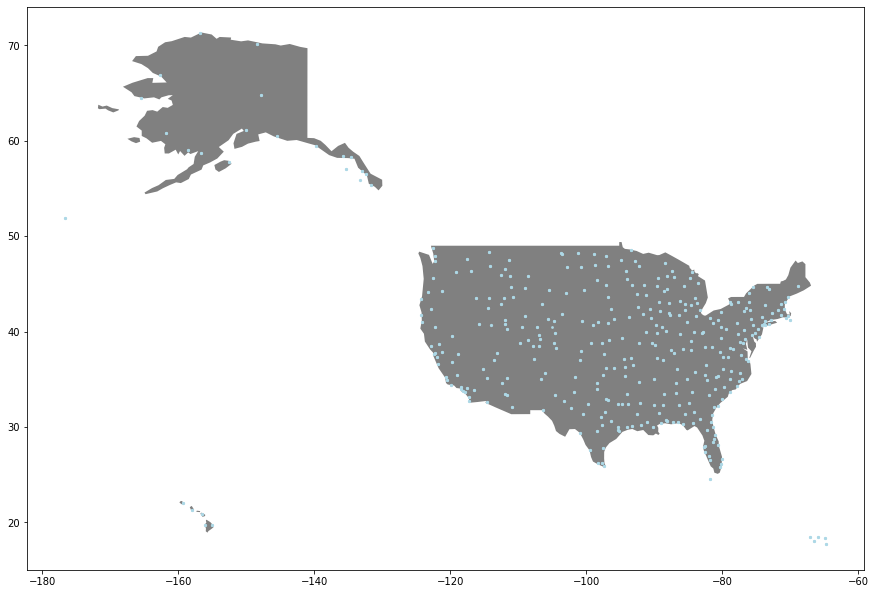

<AxesSubplot:>

In [0]:
fig, ax = plt.subplots(figsize=(15,20))
gdf_US_2.plot(ax=ax, color='grey')#.boundary
gdf_origin_airport_full.plot(ax=ax, color='lightblue',markersize=5)
gdf_dest_airport_full.plot(ax=ax,markersize=4,color='lightblue',lw=0.7)
# gdf_stationid_nooutlier.plot(ax=ax,markersize=4,color='yellow')#facecolor="none", edgecolor='lightblue', lw=0.7)

In [0]:
!pip install basemap

Collecting basemap
 Downloading basemap-1.3.2-cp38-cp38-manylinux1_x86_64.whl (862 kB)
 ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 862.8/862.8 KB 1.3 MB/s eta 0:00:00

Collecting pyshp<2.2,>=1.2
 Downloading pyshp-2.1.3.tar.gz (219 kB)
 ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 219.6/219.6 KB 458.5 kB/s eta 0:00:00

 Preparing metadata (setup.py) ... - \ done
Collecting basemap-data<1.4,>=1.3.2
 Downloading basemap_data-1.3.2-py2.py3-none-any.whl (30.5 MB)
 ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 30.5/30.5 MB 43.8 MB/s eta 0:00:00

Requirement already satisfied: pyproj<3.4.0,>=1.9.3 in /databricks/python3/lib/python3.8/site-packages (from basemap) (3.3.0)
Requirement already satisfied: six<1.16,>=1.10 in /databricks/python3/lib/python3.8/site-packages (from basemap) (1.15.0)
Requirement already satisfied: matplotlib<3.6,>=1.5 in /databricks/python3/lib/python3.8/site-packages (from basemap) (3.4.2)
Collecting numpy<1.23,>=1.21
 Downloading numpy-1.22.3-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (16.8 MB)
 ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.8/16.8 MB 50.5 MB/s eta 0:00:00

Requirement already satisfied: kiwisolver>=1.0.1 in /databricks/python3/lib/python3.8/site-packages (from matplotlib<3.6,>=1.5->basemap) (1.3.1)
Requirement already satisfied: cycler>=0.10 in /databricks/python3/lib/python3.8/site-packages (from matplotlib<3.6,>=1.5->basemap) (0.10.0)
Requirement already satisfied: pillow>=6.2.0 in /databricks/python3/lib/python3.8/site-packages (from matplotlib<3.6,>=1.5->basemap) (8.2.0)
Requirement already satisfied: pyparsing>=2.2.1 in /databricks/python3/lib/python3.8/site-packages (from matplotlib<3.6,>=1.5->basemap) (2.4.7)
Requirement already satisfied: python-dateutil>=2.7 in /databricks/python3/lib/python3.8/site-packages (from matplotlib<3.6,>=1.5->basemap) (2.8.1)
Requirement already satisfied: certifi in /databricks/python3/lib/python3.8/site-packages (from pyproj<3.4.0,>=1.9.3->basemap) (2020.12.5)
Building wheels for collected packages: pyshp
 Building wheel for pyshp (setup.py) ... - \ | done
 Created wheel for pyshp: filename=pyshp-2.1.3-py3-none-any.whl size=37263 sha256=77da81944802e4072659589d565acf25aadb34817681ca9548ca2f6ba2971c54
 Stored in directory: /root/.cache/pip/wheels/1f/1b/b5/54affbefc8a7e2bdf1da000fc576b8a1c91338f1f327a04f4c
Successfully built pyshp
Installing collected packages: pyshp, numpy, basemap-data, basemap
 Attempting uninstall: numpy
 Found existing installation: numpy 1.19.2
 Uninstalling numpy-1.19.2:
 Successfully uninstalled numpy-1.19.2
Successfully installed basemap-1.3.2 basemap-data-1.3.2 numpy-1.22.3 pyshp-2.1.3

No handles with labels found to put in legend.
Out[92]:

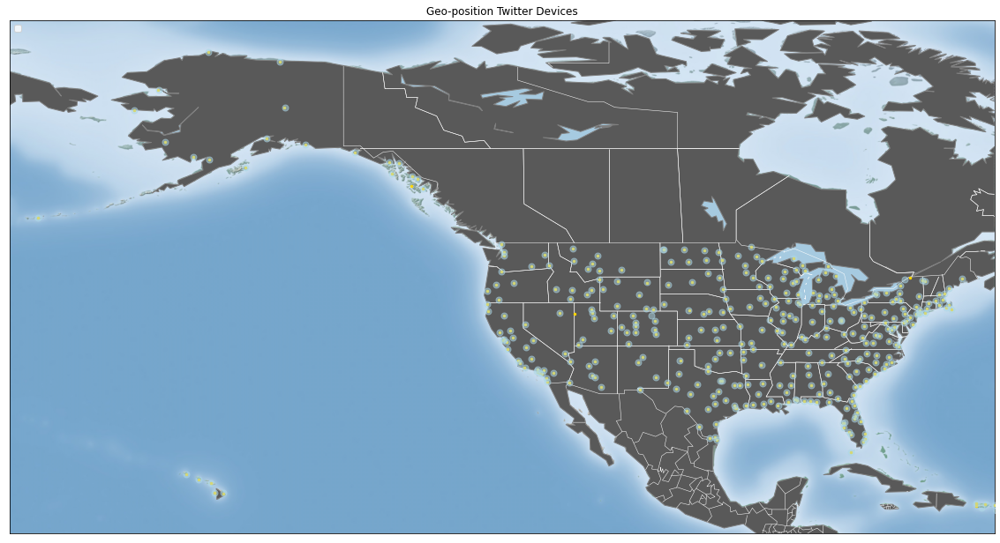

Text(0.5, 1.0, 'Geo-position Twitter Devices')

In [0]:
# libraries

from mpl_toolkits.basemap import Basemap
import numpy as np
import matplotlib.pyplot as plt

# 1. Draw the map background
fig = plt.figure(figsize=(20, 20))

map = Basemap(llcrnrlon=-180, llcrnrlat=15, urcrnrlon=-65.,urcrnrlat=75., lat_0 = 40., lon_0 = -80)
#, latlon=True, s=area, cmap='Reds', alpha=0.5)
map.shadedrelief()
map.scatter(gdf_stationid_full['ORI_station_lon'].values, gdf_stationid_full['ORI_station_lat'].values,zorder=5, color='gold', s=6)
map.scatter(gdf_dest_airport_full['airport_lon'].values, gdf_dest_airport_full['airport_lat'].values,zorder=5, color='lightblue',alpha=0.5,s=50)
map.drawcoastlines(color='gray')
map.fillcontinents(color='#595959ff',lake_color='#A6CAE0', zorder=1)
map.drawcountries(color='white')
map.drawstates(color='white')


Out[93]:

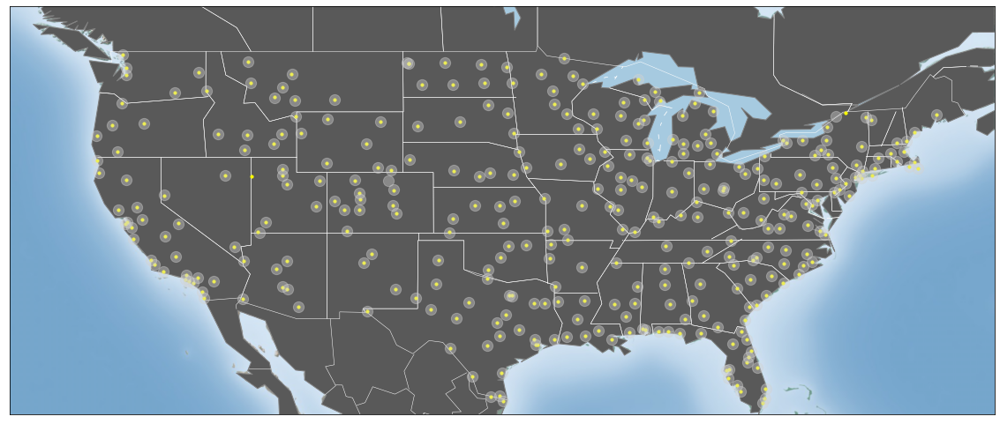

<matplotlib.collections.LineCollection at 0x7f693fb08040>

In [0]:
# libraries

from mpl_toolkits.basemap import Basemap
import numpy as np
import matplotlib.pyplot as plt

# 1. Draw the map background
fig = plt.figure(figsize=(20, 20))

map = Basemap(llcrnrlon=-130, llcrnrlat=25, urcrnrlon=-65.,urcrnrlat=52., lat_0 = 40., lon_0 = -80)
#, latlon=True, s=area, cmap='Reds', alpha=0.5)
map.shadedrelief()
map.scatter(gdf_stationid_full['ORI_station_lon'].values, gdf_stationid_full['ORI_station_lat'].values,zorder=5, color='yellow', s=10)
map.scatter(gdf_dest_airport_full['airport_lon'].values, gdf_dest_airport_full['airport_lat'].values,zorder=5, color='lightgray',alpha=0.4,s=150)
map.drawcoastlines(color='gray')
map.fillcontinents(color='#595959ff',lake_color='#A6CAE0', zorder=1)
map.drawcountries(color='white')
map.drawstates(color='white')

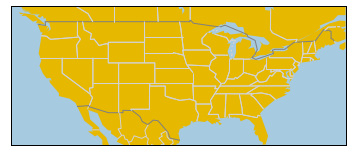

In [0]:
# initialise
 
# background color
map.drawmapboundary(fill_color='#A6CAE0', color="black")

# country color
map.fillcontinents(color='#e6b800')#,lake_color='#A6CAE0')
map.drawcountries(color='grey', linewidth=1)

# Show states
map.drawstates(color='lightgrey', linewidth=1)
plt.show()

# fig, ax = plt.subplots(figsize=(15,20))
# gdf_US_2.plot(ax=ax, color='grey')#.boundary
# gdf_origin_airport_full.plot(ax=ax, color='lightblue',markersize=5)
# gdf_dest_airport_full.plot(ax=ax,markersize=5,lw=0.7)
# gdf_stationid_nooutlier.plot(ax=ax,markersize=100,facecolor="none", edgecolor='lightblue', lw=0.7)

In [0]:
with plt.style.context(("seaborn", "ggplot")):
    ## Plot world
    world[world.name == "Brazil"].plot(figsize=(15,15), edgecolor="grey", color="white");

    ## Loop through each flight plotting line depicting flight between source and destination
    ## We are also plotting scatter points depicting source and destinations
    for slat,dlat, slon, dlon, num_flights in zip(brazil_cnt_df["LatOrig"], brazil_cnt_df["LatDest"], brazil_cnt_df["LongOrig"], brazil_cnt_df["LongDest"], brazil_cnt_df["Num_Of_Flights"]):
        plt.plot([slon , dlon], [slat, dlat], linewidth=num_flights/100, color="lime", alpha=0.5)
        plt.scatter( [slon, dlon], [slat, dlat], color="orangered", alpha=0.1, s=num_flights)

    plt.title("Connection Map Depicting Flights between Cities of Brazil")

    plt.savefig("connection-map-geopandas-4.png", dpi=100)

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-4070574709971817> in <module> 
 1 with plt . style . context ( ( "seaborn" , "ggplot" ) ) : 
 2 ## Plot world 
 ----> 3 world [ world . name == "Brazil" ] . plot ( figsize = ( 15 , 15 ) , edgecolor = "grey" , color = "white" ) ; 
 4 
 5 ## Loop through each flight plotting line depicting flight between source and destination 

 NameError : name 'world' is not defined

# 2. Show the trend of tail number and delay

In [0]:
display(df_5yr_join)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,CANCELLED,ACTUAL_ELAPSED_TIME,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,LATE_AIRCRAFT_DELAY,ORI_IATA,ORI_station_id,ORI_station_lat,ORI_station_lon,ORI_airport_lat,ORI_airport_lon,ORI_elevation,ORI_dist_airp_sta,DEST_IATA,DEST_station_id,DEST_station_lat,DEST_station_lon,DEST_airport_lat,DEST_airport_lon,DEST_elevation,DEST_dist_airp_sta,CRS_DEP_HRS,CRS_DEP_MINS,CRS_DEP_TIME_STR,CRS_DEP_DT_STR,CRS_DEP_DATETIME,iata_code,ORI_timezone,CRS_DEP_DATETIME_UTC,CRS_DEP_DATETIME_UTC_END,CRS_DEP_DATETIME_UTC_START,STATION,DATE,LATITUDE,LONGITUDE,ELEVATION,REPORT_TYPE,DEST_timezone,DEP_HRS,DEP_MINS,DEP_TIME_STR,DEP_DT_STR,DEP_DATETIME,ARR_DATETIME_ACTUAL_UTC,late_night,daytime,evening,region_name,new_england,mid_atlantic,south,midwest,southwest,west,pacific_islands,atlantic_islands,spring,summer,autumn,winter,dep_date,weekend_or_holiday,flightID,ID,previous_flight_delay_status,previous_flight_dep_time,time_between_departures_min,valid_dep_delay,prior_dep_delayed,previous_DEP_DELAY_NEW_value,previous_DEP_DELAY_NEW,previous_flight_arrdelay_status,previous_flight_arr_time,time_between_arrival_and_end_min,valid_arr_delay,prior_arr_delayed,previous_ARR_DELAY_NEW_value,previous_ARR_DELAY_NEW,prev_arrival_airport,plane_is_here,avg_carrier_delay_24hrs,flights_sch_Today_ORIGIN,flights_sch_Today_DEST,avg_ori_airport_delay_24hrs,year_quarter,quarter_enum,quarter_enum_prev,month_seq_index,wnd_2_wind_obs_type,wnd_3_wind_sp_rate,cig_0_height,vis_0_distance,slp_0_day_avg,tmp_0_air_temp,dew_0_point_temp,ma1_0_altimeter_setting_rate,ma1_2_station_pressure_rate,gd1_3_sky_cover_height,WND_3_wind_speed,CIG_0_sky_ceiling_height,VIS_0_visibility_dist,SLP_0_avg_station_press,TMP_0_air_temperature,DEW_0_dew_pt_temp,MA1_0_altimeter_set_rate,MA1_2_station_pres_rate,OC1_0_wind_gust_spd_rate_imp,GD1_3_cloud_height,AA1_1_liquid_precip,AA3_1_liquid_precip,gd1_0_sky_coverage,au2_4_extreme_wind_weather,mv1_0_sand_dust_near,mv1_0_thunder_rain_near,aw1_mw1_0_smoke_haze_dust,aw1_mw1_0_fog,aw1_mw1_0_rain_drizzle,aw1_mw1_0_freezing_rain_drizzle,aw1_mw1_0_snow,aw1_mw1_0_hail_or_ice,aw1_mw1_0_thunderstorm,aw1_mw1_0_tornado,SLP_0_avg_station_press_imp,WND_3_wind_speed_imp,CIG_0_sky_ceiling_height_imp,VIS_0_visibility_dist_imp,TMP_0_air_temperature_imp,DEW_0_dew_pt_temp_imp,MA1_0_altimeter_set_rate_imp,MA1_2_station_pres_rate_imp,GD1_3_cloud_height_imp
2018,1,2,1,4,2018-02-01,AA,19805,N721UW,2070,10397,1039707,ATL,GA,13,Georgia,11057,1105703,CLT,NC,37,North Carolina,535,528,-7.0,0.0,0.0,-1,0001-0559,646,640,-6.0,0.0,0.0,0.0,72.0,226.0,1,null,null,null,null,ATL,72219013874,33.63,-84.442,33.6367,-84.428101,1026.0,1.4868906335816192,CLT,72314013881,35.224,-80.955,35.2140007,-80.94309998,748.0,1.550757753493052,5,35,05:35,2018-02-01 05:35,2018-02-01T05:35:00.000+0000,ATL,America/New_York,2018-02-01T10:35:00.000+0000,2018-02-01T08:35:00.000+0000,2018-02-01T06:35:00.000+0000,72219013874,2018-02-01T07:52:00.000+0000,33.6301,-84.4418,307.8,FM-15,America/New_York,05,28,05:28,2018-02-01 05:28,2018-02-01T05:28:00.000+0000,2018-02-01T11:40:00.000+0000,1,0,0,south,0,0,1,0,0,0,0,0,0,0,0,1,2018-02-01,0,42950192658,AAN721UWATL2018-02-01535,0.0,2018-02-01T01:20:00.000+0000,555.0,yes,0,0.0,0.0,0.0,2018-02-01T03:29:00.000+0000,426.0,yes,0,0.0,0.0,ATL,1,0.06,1080,625,0.05,2018-1,12,11,37,N,0021,22000,016093,10221,+0044,-0044,10220,09847,+01067,21,22000,16093,10221,44,-44,10220,9847,0,1067,0,0,0,0,0,0,0,0,0,0,0,0,0,0,10221.0,21.0,22000.0,16093.0,44.0,-44.0,10220.0,9847.0,1067.0
2018,1,2,1,4,2018-02-01,YV,20378,N86316,6098,10397,1039707,ATL,GA,

In [0]:
display(df_5yr_join.groupby(['DEP_DEL15']).count())

DEP_DEL15,count
0.0,25430901
1.0,5650033


In [0]:
5650033/25430901

Out[106]: 0.2221719552917138

In [0]:
# create column of count of delay/nodelay in two separate df
tail_num_delay = df_5yr_join.filter(df_5yr_join.DEP_DEL15 == 1).groupby(['TAIL_NUM']).count().withColumnRenamed('count','delay') #'ORIGIN','DEST'
tail_num_nodelay = df_5yr_join.filter(df_5yr_join.DEP_DEL15 == 0).groupby(['TAIL_NUM']).count().withColumnRenamed('count','nodelay') #,'ORIGIN','DEST'
display(tail_num_nodelay)

TAIL_NUM,nodelay
N902DE,7744
N38451,4268
N6700,4188
N927DN,6229
N997NN,1932
N8513F,3899
N9616G,1754
N8322X,6163
N331NB,4138
N623NK,6352


In [0]:
# join two dataset
tail_num_overview = tail_num_delay.join(tail_num_nodelay, tail_num_nodelay.TAIL_NUM == tail_num_delay.TAIL_NUM)

In [0]:
display(tail_num_overview)

TAIL_NUM,delay,TAIL_NUM,nodelay
N954WN,2191,N954WN,8107
N8322X,1275,N8322X,6163
N902DE,1165,N902DE,7744
N971AA,218,N971AA,1381
N927DN,1174,N927DN,6229
N3CWAA,521,N3CWAA,2427
N369NB,912,N369NB,5231
N623NK,1664,N623NK,6352
N567AA,462,N567AA,2640
N102UW,765,N102UW,3723


In [0]:
# # add column that shows ratio
tail_num_delay_ratio_full = tail_num_overview.withColumn('delay_ratio', col('delay') / (col('delay')+col('nodelay'))).withColumn('total_flights', col('delay')+col('nodelay'))
display(tail_num_delay_ratio_full)

TAIL_NUM,delay,TAIL_NUM,nodelay,delay_ratio,total_flights
N902DE,1165,N902DE,7744,0.13076664047592323,8909
N38451,934,N38451,4268,0.17954632833525566,5202
N6700,729,N6700,4188,0.14826113483831604,4917
N927DN,1174,N927DN,6229,0.15858435769282722,7403
N997NN,420,N997NN,1932,0.17857142857142858,2352
N8513F,925,N8513F,3899,0.19174958540630183,4824
N9616G,551,N9616G,1754,0.23904555314533624,2305
N8322X,1275,N8322X,6163,0.1714170475934391,7438
N331NB,754,N331NB,4138,0.15412919051512675,4892
N623NK,1664,N623NK,6352,0.20758483033932135,8016


In [0]:
# filter with tail number that has >1000 total flights in 5 years
tail_num_delay_ratio_full_1000 = tail_num_delay_ratio_full.filter(tail_num_delay_ratio_full.total_flights > 1000).sort(desc('delay_ratio'))
display(tail_num_delay_ratio_full_1000)

TAIL_NUM,delay,TAIL_NUM,nodelay,delay_ratio,total_flights
N102DU,376,N102DU,776,0.3263888888888889,1152
N376SW,1570,N376SW,3338,0.31988590057049715,4908
N5PBMQ,323,N5PBMQ,703,0.3148148148148148,1026
N949JB,825,N949JB,1811,0.3129742033383915,2636
N913JB,951,N913JB,2107,0.3109875735775016,3058
N563JB,1539,N563JB,3413,0.31078352180936997,4952
N105DU,335,N105DU,745,0.3101851851851852,1080
N516JB,1527,N516JB,3475,0.3052778888444622,5002
N965JB,628,N965JB,1437,0.30411622276029054,2065
N954JB,913,N954JB,2105,0.30251822398939693,3018


In [0]:
tail_num_origin_dest_full = df_5yr_join.groupby(['TAIL_NUM','ORIGIN','ORIGIN_STATE_NM','DEST','DEST_STATE_NM']).count()
display(tail_num_origin_dest_full)

TAIL_NUM,ORIGIN,ORIGIN_STATE_NM,DEST,DEST_STATE_NM,count
N565WN,LAX,California,HOU,Texas,9
N373DA,LAX,California,SLC,Utah,72
N126AN,LAX,California,HNL,Hawaii,176
N754SK,LAX,California,RNO,Nevada,23
N838VA,LAX,California,IAD,Virginia,83
N735SA,LAX,California,IND,Indiana,2
N445WN,LAX,California,MDW,Illinois,13
N982JB,LAX,California,JFK,New York,247
N8534Z,LAX,California,ATL,Georgia,11
N587UW,LAX,California,PHX,Arizona,45


In [0]:
# create column of count of delay/nodelay in two separate df
tail_num_origin_dest_fulldelay = df_5yr_join.filter(df_5yr_join.DEP_DEL15 == 1).groupby(['TAIL_NUM','ORIGIN','ORIGIN_STATE_NM','DEST','DEST_STATE_NM']).count().withColumnRenamed('count','delay') #'ORIGIN','DEST'
tail_num_origin_dest_fullnodelay = df_5yr_join.filter(df_5yr_join.DEP_DEL15 == 0).groupby(['TAIL_NUM','ORIGIN','ORIGIN_STATE_NM','DEST','DEST_STATE_NM']).count().withColumnRenamed('count','nodelay') #,'ORIGIN','DEST'
display(tail_num_origin_dest_fullnodelay)

TAIL_NUM,ORIGIN,ORIGIN_STATE_NM,DEST,DEST_STATE_NM,nodelay
N377DE,ATL,Georgia,PNS,Florida,272
N926DL,ATL,Georgia,MSY,Louisiana,48
N306DQ,ATL,Georgia,EYW,Florida,550
N920DE,ATL,Georgia,CLE,Ohio,60
N315PQ,ATL,Georgia,SAV,Georgia,1
N7859B,ATL,Georgia,HOU,Texas,6
N915DL,ATL,Georgia,MSY,Louisiana,50
N8673F,ATL,Georgia,MKE,Wisconsin,2
N547US,ATL,Georgia,MSY,Louisiana,26
N949DN,ATL,Georgia,MSP,Minnesota,56


In [0]:
tail_num_origin_dest_fulldelay.count()

Out[135]: 1816721

In [0]:
tail_num_origin_dest_fullnodelay.count()

Out[136]: 2814419

In [0]:
# join two dataset
tail_num_origin_dest_overview = tail_num_origin_dest_fulldelay.join(tail_num_origin_dest_fullnodelay, 
                                                        (tail_num_origin_dest_fulldelay.TAIL_NUM == tail_num_origin_dest_fullnodelay.TAIL_NUM) &
                                                        (tail_num_origin_dest_fulldelay.ORIGIN == tail_num_origin_dest_fullnodelay.ORIGIN) & 
                                                        (tail_num_origin_dest_fulldelay.DEST == tail_num_origin_dest_fullnodelay.DEST)
                                                       )

In [0]:
# add column that shows ratio
tail_num_delay_ratio_full = tail_num_origin_dest_overview.withColumn('delay_ratio', col('delay') / (col('delay')+col('nodelay'))).withColumn('total_flights', col('delay')+col('nodelay'))
display(tail_num_delay_ratio_full)

TAIL_NUM,ORIGIN,ORIGIN_STATE_NM,DEST,DEST_STATE_NM,delay,TAIL_NUM,ORIGIN,ORIGIN_STATE_NM,DEST,DEST_STATE_NM,nodelay,delay_ratio,total_flights
215NV,AZA,Arizona,CVG,Kentucky,1,215NV,AZA,Arizona,CVG,Kentucky,5,0.16666666666666666,6
215NV,AZA,Arizona,IDA,Idaho,3,215NV,AZA,Arizona,IDA,Idaho,13,0.1875,16
215NV,AZA,Arizona,OMA,Nebraska,1,215NV,AZA,Arizona,OMA,Nebraska,8,0.1111111111111111,9
215NV,AZA,Arizona,PVU,Utah,6,215NV,AZA,Arizona,PVU,Utah,53,0.1016949152542373,59
215NV,AZA,Arizona,RFD,Illinois,1,215NV,AZA,Arizona,RFD,Illinois,11,0.08333333333333333,12
215NV,AZA,Arizona,SGF,Missouri,2,215NV,AZA,Arizona,SGF,Missouri,13,0.13333333333333333,15
215NV,FLL,Florida,USA,North Carolina,7,215NV,FLL,Florida,USA,North Carolina,22,0.2413793103448276,29
215NV,GSP,South Carolina,FLL,Florida,3,215NV,GSP,South Carolina,FLL,Florida,9,0.25,12
215NV,IND,Indiana,MYR,South Carolina,1,215NV,IND,Indiana,MYR,South Carolina,2,0.3333333333333333,3
215NV,IND,Indiana,PIE,Florida,2,215NV,IND,Indiana,PIE,Florida,6,0.25,8


In [0]:
tail_ori_dest_delay_ratio_summary = tail_num_delay_ratio_full.filter(tail_num_delay_ratio_full.total_flights > 50).sort(desc('delay_ratio'))

In [0]:
display(tail_ori_dest_delay_ratio_summary)

TAIL_NUM,ORIGIN,ORIGIN_STATE_NM,DEST,DEST_STATE_NM,delay,TAIL_NUM,ORIGIN,ORIGIN_STATE_NM,DEST,DEST_STATE_NM,nodelay,delay_ratio,total_flights
N2332U,SFO,California,EWR,New Jersey,40,N2332U,SFO,California,EWR,New Jersey,16,0.7142857142857143,56
N2331U,SFO,California,EWR,New Jersey,42,N2331U,SFO,California,EWR,New Jersey,21,0.6666666666666666,63
N388AA,ORD,Illinois,MIA,Florida,34,N388AA,ORD,Illinois,MIA,Florida,26,0.5666666666666667,60
N461SW,ORD,Illinois,CVG,Kentucky,33,N461SW,ORD,Illinois,CVG,Kentucky,26,0.559322033898305,59
N638JB,MCO,Florida,EWR,New Jersey,49,N638JB,MCO,Florida,EWR,New Jersey,39,0.5568181818181818,88
N781UA,DEN,Colorado,SFO,California,29,N781UA,DEN,Colorado,SFO,California,24,0.5471698113207547,53
N618JB,MCO,Florida,EWR,New Jersey,36,N618JB,MCO,Florida,EWR,New Jersey,30,0.5454545454545454,66
N768UA,ORD,Illinois,SFO,California,55,N768UA,ORD,Illinois,SFO,California,47,0.5392156862745098,102
N290SY,ORD,Illinois,LGA,New York,28,N290SY,ORD,Illinois,LGA,New York,25,0.5283018867924528,53
N623JB,FLL,Florida,EWR,New Jersey,35,N623JB,FLL,Florida,EWR,New Jersey,32,0.5223880597014925,67


In [0]:
# create column of count of delay/nodelay in two separate df
origin_dest_fulldelay = df_5yr_join.filter(df_5yr_join.DEP_DEL15 == 1).groupby(['ORIGIN','ORIGIN_STATE_NM','DEST','DEST_STATE_NM']).count().withColumnRenamed('count','delay') #'ORIGIN','DEST'
origin_dest_fullnodelay = df_5yr_join.filter(df_5yr_join.DEP_DEL15 == 0).groupby(['ORIGIN','ORIGIN_STATE_NM','DEST','DEST_STATE_NM']).count().withColumnRenamed('count','nodelay') #,'ORIGIN','DEST'
display(origin_dest_fullnodelay)

# join two dataset
origin_dest_overview = origin_dest_fulldelay.join(origin_dest_fullnodelay, 
                                                        (origin_dest_fulldelay.ORIGIN == origin_dest_fullnodelay.ORIGIN) & 
                                                        (origin_dest_fulldelay.DEST == origin_dest_fullnodelay.DEST)
                                                       )

ORIGIN,ORIGIN_STATE_NM,DEST,DEST_STATE_NM,nodelay
DTW,Michigan,MSP,Minnesota,13134
EWR,New Jersey,PVD,Rhode Island,2039
VPS,Florida,CLT,North Carolina,2278
BIL,Montana,ORD,Illinois,244
DFW,Texas,LFT,Louisiana,4181
DFW,Texas,TRI,Tennessee,206
EWR,New Jersey,BGR,Maine,1172
DTW,Michigan,BTV,Vermont,2313
HOU,Texas,EWR,New Jersey,867
MSP,Minnesota,DTW,Michigan,13285


In [0]:
# add column that shows ratio
origin_dest_delay_ratio_full = origin_dest_overview.withColumn('delay_ratio', col('delay') / (col('delay')+col('nodelay'))).withColumn('total_flights', col('delay')+col('nodelay'))
display(origin_dest_delay_ratio_full)

ORIGIN,ORIGIN_STATE_NM,DEST,DEST_STATE_NM,delay,ORIGIN,ORIGIN_STATE_NM,DEST,DEST_STATE_NM,nodelay,delay_ratio,total_flights
ATL,Georgia,ELP,Texas,688,ATL,Georgia,ELP,Texas,3568,0.16165413533834586,4256
VPS,Florida,CLT,North Carolina,493,VPS,Florida,CLT,North Carolina,2278,0.17791411042944785,2771
EWR,New Jersey,PVD,Rhode Island,747,EWR,New Jersey,PVD,Rhode Island,2039,0.26812634601579327,2786
BIL,Montana,ORD,Illinois,26,BIL,Montana,ORD,Illinois,244,0.0962962962962963,270
DTW,Michigan,MSP,Minnesota,1828,DTW,Michigan,MSP,Minnesota,13134,0.12217617965512632,14962
ATL,Georgia,BNA,Tennessee,2987,ATL,Georgia,BNA,Tennessee,16892,0.15025906735751296,19879
DFW,Texas,LFT,Louisiana,1003,DFW,Texas,LFT,Louisiana,4181,0.19347993827160495,5184
DFW,Texas,TRI,Tennessee,34,DFW,Texas,TRI,Tennessee,206,0.14166666666666666,240
EWR,New Jersey,BGR,Maine,396,EWR,New Jersey,BGR,Maine,1172,0.25255102040816324,1568
EUG,Oregon,LAX,California,467,EUG,Oregon,LAX,California,3359,0.12205959226346054,3826


In [0]:
display(origin_dest_delay_ratio_full.filter(origin_dest_delay_ratio_full.total_flights > 1000).sort(desc('delay_ratio')))

ORIGIN,ORIGIN_STATE_NM,DEST,DEST_STATE_NM,delay,ORIGIN,ORIGIN_STATE_NM,DEST,DEST_STATE_NM,nodelay,delay_ratio,total_flights
EWR,New Jersey,BQN,Puerto Rico,689,EWR,New Jersey,BQN,Puerto Rico,924,0.42715437073775575,1613
MYR,South Carolina,EWR,New Jersey,809,MYR,South Carolina,EWR,New Jersey,1172,0.4083796062594649,1981
HOU,Texas,OMA,Nebraska,399,HOU,Texas,OMA,Nebraska,628,0.3885102239532619,1027
LAX,California,BUF,New York,426,LAX,California,BUF,New York,676,0.38656987295825773,1102
LGA,New York,CAK,Ohio,406,LGA,New York,CAK,Ohio,678,0.37453874538745385,1084
HOU,Texas,JFK,New York,642,HOU,Texas,JFK,New York,1086,0.3715277777777778,1728
SJC,California,BOS,Massachusetts,502,SJC,California,BOS,Massachusetts,858,0.36911764705882355,1360
HOU,Texas,PNS,Florida,666,HOU,Texas,PNS,Florida,1145,0.3677526228602982,1811
OTH,Oregon,SFO,California,516,OTH,Oregon,SFO,California,901,0.3641496118560339,1417
MDW,Illinois,SFO,California,1408,MDW,Illinois,SFO,California,2504,0.35991820040899797,3912


## Are there any trend in delay by destination? 

- Detinations such as CLT or MIA are likely to have smaller ratio of delayed flights, regardless of the two ORIGIN 
- There seems to be common destinations that has smaller ratio of delayed flight such as CLT or MIA, regardless of the 

- Note: While ORD and ATL are the TOP3 airports with the largest number of flights in the US, flights between ORD<->ATL are not as large as assumed

### Ratio of delayed fights by combinations of ORIGIN/DESTINATIONS

- Extract Top 20 destinations with higher total number of flights

#### ORD to Top 20 Destinations

In [0]:
# find top 20 airport for total flight count
df_5yr_join_3 = df_5yr_join.filter(df_5yr_join.ORIGIN == 'ORD')\
        .groupby(['DEST'])\
        .count()\
        .sort(desc('count'))\
        .select(['DEST'])\

# convert to pandas
pdf_5yr_join_3 = df_5yr_join_3.toPandas()
# filter to top 20 airports 
band_list = [i for i in pdf_5yr_join_3['DEST']][:20]
band_list

# Show proprotion of 
display(df_5yr_join.filter(col('DEST').isin(band_list)==True)\
        .groupby(['DEST','DEP_DEL15'])\
        .count()\
        .sort(desc('count')))

In [0]:
# find top 20 airport for total flight count
df_5yr_join_3 = df_5yr_join.filter(df_5yr_join.ORIGIN == 'ORD')\
        .groupby(['DEST'])\
        .count()\
        .sort(desc('count'))\
        .select(['DEST'])\

# convert to pandas
pdf_5yr_join_3 = df_5yr_join_3.toPandas()
# filter to top 20 airports 
band_list = [i for i in pdf_5yr_join_3['DEST']][:20]
band_list

# Show proprotion of 
display(df_5yr_join.filter(col('DEST').isin(band_list)==True)\
        .groupby(['DEST','DEP_DEL15'])\
        .count()\
        .sort(desc('count')))

#### Total delayed flights by destination(ORIGIN == ORD)

In [0]:
# find top 20 airport for total flight count
df_5yr_join_3 = df_5yr_join.filter(df_5yr_join.ORIGIN == 'ORD')\
        .groupby(['DEST'])\
        .count()\
        .sort(desc('count'))\
        .select(['DEST'])\

# convert to pandas
pdf_5yr_join_3 = df_5yr_join_3.toPandas()
# filter to top 20 airports 
band_list = [i for i in pdf_5yr_join_3['DEST']][:20]
band_list

# Show proprotion of 
display(df_5yr_join.filter(col('DEST').isin(band_list)==True)\
        .filter(df_5yr_join.DEP_DEL15 == 1)\
        .groupby(['DEST','DEP_DEL15'])\
        .count()\
        .sort(desc('count')))

### ATL to Top 20 Destinations

In [0]:
# find top 20 airport for total flight count
df_5yr_join_3 = df_5yr_join.filter(df_5yr_join.ORIGIN == 'ATL')\
        .groupby(['DEST'])\
        .count()\
        .sort(desc('count'))\
        .select(['DEST'])\

# convert to pandas
pdf_5yr_join_3 = df_5yr_join_3.toPandas()
# filter to top 20 airports 
band_list = [i for i in pdf_5yr_join_3['DEST']][:20]
band_list

# Show proprotion of 
display(df_5yr_join.filter(col('DEST').isin(band_list)==True)\
        .groupby(['DEST','DEP_DEL15'])\
        .count()\
        .sort(desc('count')))

In [0]:
# find top 20 airport for total flight count
df_5yr_join_3 = df_5yr_join.filter(df_5yr_join.ORIGIN == 'ATL')\
        .groupby(['DEST'])\
        .count()\
        .sort(desc('count'))\
        .select(['DEST'])\

# convert to pandas
pdf_5yr_join_3 = df_5yr_join_3.toPandas()
# filter to top 20 airports 
band_list = [i for i in pdf_5yr_join_3['DEST']][:20]
band_list

# Show proprotion of 
display(df_5yr_join.filter(col('DEST').isin(band_list)==True)\
        .groupby(['DEST','DEP_DEL15'])\
        .count()\
        .sort(desc('count')))

In [0]:
# find top 20 airport for total flight count
df_5yr_join_3 = df_5yr_join.filter(df_5yr_join.ORIGIN == 'ATL')\
        .groupby(['DEST'])\
        .count()\
        .sort(desc('count'))\
        .select(['DEST'])\

# convert to pandas
pdf_5yr_join_3 = df_5yr_join_3.toPandas()
# filter to top 20 airports 
band_list = [i for i in pdf_5yr_join_3['DEST']][:20]
band_list

# Show proprotion of 
display(df_5yr_join.filter(col('DEST').isin(band_list)==True)\
        .filter(df_5yr_join.DEP_DEL15 == 1)\
        .groupby(['DEST','DEP_DEL15'])\
        .count()\
        .sort(desc('count')))

### Is delay more likely to occur in airports with larger number of flights?

In [0]:
# count total of flight by airport(ORIGIN= ORD)
df_5yr_join_4 = df_5yr_join.filter(df_5yr_join.ORIGIN == 'ORD')\
        .groupby(['DEST'])\
        .count()\
        .sort(desc('count'))\
        .withColumnRenamed("count","count_all")

# count number of delay in each airport(ORIGIN= ORD)
df_5yr_join_4_delay = df_5yr_join.filter(df_5yr_join.ORIGIN == 'ORD')\
        .filter(df_5yr_join.DEP_DEL15 == '1')\
        .groupby(['DEST'])\
        .count()\
        .sort(desc('count'))\
        .withColumnRenamed("count","count_delay")
    
# join two tables
df_5yr_join_4_ratio = df_5yr_join_4.join(df_5yr_join_4_delay, df_5yr_join_4.DEST == df_5yr_join_4_delay.DEST)
display(df_5yr_join_4_ratio)

In [0]:
# add column that shows ratio
df_5yr_join_4_ratio = df_5yr_join_4_ratio.withColumn('delay_ratio', 100*col('count_delay') / col('count_all'))

# create a scatter plot of total number of flight and ratio of delayed flights
pdf_5yr_join_4_ratio = df_5yr_join_4_ratio.select(['count_all','delay_ratio']).toPandas()
sns.scatterplot(data=pdf_5yr_join_4_ratio, x="count_all", y="delay_ratio")

In [0]:
sns.lmplot(data=pdf_5yr_join_4_ratio, x="count_all", y="delay_ratio")

In [0]:
# count total of flight by airport(ORIGIN= ATL)
df_5yr_join_4 = df_5yr_join.filter(df_5yr_join.ORIGIN == 'ATL')\
        .groupby(['DEST'])\
        .count()\
        .sort(desc('count'))\
        .withColumnRenamed("count","count_all")

# count number of delay in each airport(ORIGIN= ATL)
df_5yr_join_4_delay = df_5yr_join.filter(df_5yr_join.ORIGIN == 'ATL')\
        .filter(df_5yr_join.DEP_DEL15 == '1')\
        .groupby(['DEST'])\
        .count()\
        .sort(desc('count'))\
        .withColumnRenamed("count","count_delay")
    
# join two tables
df_5yr_join_4_ratio = df_5yr_join_4.join(df_5yr_join_4_delay, df_5yr_join_4.DEST == df_5yr_join_4_delay.DEST)
display(df_5yr_join_4_ratio)

In [0]:
# add column that shows ratio
df_5yr_join_4_ratio = df_5yr_join_4_ratio.withColumn('delay_ratio', 100*col('count_delay') / col('count_all'))

# create a scatter plot of total number of flight and ratio of delayed flights
pdf_5yr_join_4_ratio = df_5yr_join_4_ratio.select(['count_all','delay_ratio']).toPandas()
sns.scatterplot(data=pdf_5yr_join_4_ratio, x="count_all", y="delay_ratio")

In [0]:
sns.lmplot(data=pdf_5yr_join_4_ratio, x="count_all", y="delay_ratio")

# 2. More preprocessing on dataset

## Create dataset for graph analysis

Jan-March data

In [0]:
# count total of flight by airport(ORIGIN= ATL)
df_5yr_join_4 = df_5yr_join.filter(df_5yr_join.MONTH <= '3')\
        .groupby(['ORIGIN','DEST'])\
        .count()\
        .sort(desc('count'))\
        .withColumnRenamed("count","count_all")

# count number of delay in each airport(ORIGIN= ATL)
df_5yr_join_4_delay = df_5yr_join.filter(df_5yr_join.MONTH <= '3')\
        .filter(df_5yr_join.DEP_DEL15 == '1')\
        .groupby(['ORIGIN','DEST'])\
        .count()\
        .sort(desc('count'))\
        .withColumnRenamed("count","count_delay")\
        .withColumnRenamed("ORIGIN","ORIGIN2")\
        .withColumnRenamed("DEST","DEST2")
  
    
# join two tables
df_5yr_join_4_ratio = df_5yr_join_4.join(df_5yr_join_4_delay, (df_5yr_join_4.DEST == df_5yr_join_4_delay.DEST2) & (df_5yr_join_4.ORIGIN == df_5yr_join_4_delay.ORIGIN2))
display(df_5yr_join_4_ratio)

In [0]:
# add column that shows ratio
df_5yr_join_4_ratio = df_5yr_join_4_ratio.withColumn('delay_ratio', col('count_delay') / col('count_all'))
display(df_5yr_join_4_ratio.select(['ORIGIN','DEST','delay_ratio']))

In [0]:
# store file to blob
airlines6m_for_graph_jan_mar_0313 = df_5yr_join_4_ratio.select(['ORIGIN','DEST','delay_ratio'])
airlines6m_for_graph_jan_mar_0313.write.parquet(f"{blob_url}/airlines6m_for_graph_jan_mar_0313")

April-June

In [0]:
# count total of flight by airport(ORIGIN= ATL)
df_5yr_join_5 = df_5yr_join.filter(df_5yr_join.MONTH >= '4')\
        .groupby(['ORIGIN','DEST'])\
        .count()\
        .sort(desc('count'))\
        .withColumnRenamed("count","count_all")

# count number of delay in each airport(ORIGIN= ATL)
df_5yr_join_5_delay = df_5yr_join.filter(df_5yr_join.MONTH >= '4')\
        .filter(df_5yr_join.DEP_DEL15 == '1')\
        .groupby(['ORIGIN','DEST'])\
        .count()\
        .sort(desc('count'))\
        .withColumnRenamed("count","count_delay")\
        .withColumnRenamed("ORIGIN","ORIGIN2")\
        .withColumnRenamed("DEST","DEST2")
  
    
# join two tables
df_5yr_join_5_ratio = df_5yr_join_5.join(df_5yr_join_5_delay, (df_5yr_join_5.DEST == df_5yr_join_5_delay.DEST2) & (df_5yr_join_5.ORIGIN == df_5yr_join_5_delay.ORIGIN2))
display(df_5yr_join_5_ratio)

# # add column that shows ratio
df_5yr_join_5_ratio = df_5yr_join_5_ratio.withColumn('delay_ratio', col('count_delay') / col('count_all'))
display(df_5yr_join_5_ratio.select(['ORIGIN','DEST','delay_ratio']))

In [0]:
# store file to blob
airlines6m_for_graph_apr_june_0313 = df_5yr_join_5_ratio.select(['ORIGIN','DEST','delay_ratio'])
airlines6m_for_graph_apr_june_0313.write.parquet(f"{blob_url}/airlines6m_for_graph_apr_june_0313")

## Update airlines_6months

### Drop diverted flights and overlapped features(Ex. )

In [0]:
display(df_5yr_join)

In [0]:
df_5yr_join.columns

In [0]:
columns_to_drop = ['OP_CARRIER_AIRLINE_ID','OP_CARRIER','ORIGIN_AIRPORT_ID','ORIGIN_AIRPORT_SEQ_ID','ORIGIN_CITY_MARKET_ID','DEST_AIRPORT_ID','DEST_AIRPORT_SEQ_ID','DEST_CITY_MARKET_ID',
                  'ORIGIN_CITY_NAME','ORIGIN_STATE_FIPS','ORIGIN_STATE_NM','DEST_CITY_NAME','DEST_STATE_FIPS','DEST_STATE_NM','DIV_AIRPORT_LANDINGS','DIV_REACHED_DEST',                 'DIV_ACTUAL_ELAPSED_TIME', 'DIV_ARR_DELAY', 'DIV_DISTANCE', 'DIV1_AIRPORT', 'DIV1_AIRPORT_ID', 'DIV1_AIRPORT_SEQ_ID', 'DIV1_WHEELS_ON', 'DIV1_TOTAL_GTIME', 'DIV1_LONGEST_GTIME', 'DIV1_WHEELS_OFF','DIV1_TAIL_NUM', 'DIV2_TAIL_NUM', 'DIV3_WHEELS_OFF', 'DIV4_AIRPORT', 'DIV4_AIRPORT_SEQ_ID', 'DIV4_WHEELS_ON', 'DIV4_TOTAL_GTIME', 'DIV4_LONGEST_GTIME', 'DIV4_WHEELS_OFF', 'DIV4_TAIL_NUM', 'DIV5_AIRPORT', 'DIV5_AIRPORT_ID', 'DIV5_WHEELS_ON', 'DIV5_LONGEST_GTIME', 'DIV5_WHEELS_OFF']

df_5yr_join_0315 = df_5yr_join.drop(*columns_to_drop)
df_airlines_3m_0315 = df_airlines_3m.drop(*columns_to_drop)
# df = df.drop

In [0]:
display(df_5yr_join_0315)

In [0]:
display(df_airlines_3m_0315)

In [0]:
df_5yr_join_0315.write.parquet(f"{blob_url}/air6m_join_stations_0316_filtered")
df_airlines_3m_0315.write.parquet(f"{blob_url}/air3m_join_stations_0316_filtered")

### Add datetime column
- Departure time in origin & Arrival time in destination
- Scheduled time & actual time

### Add UTC time to four columns added above

d 

# APPENDIX

## Reference code from HW4

In [0]:
# CORR
# # plot heatmap for correlations matrix - RUN THIS CELL AS IS
# corr = sample_df[FIELDS[:-1]].corr()
# fig, ax = plt.subplots(figsize=(11, 9))
# mask = np.zeros_like(corr, dtype=np.bool)
# mask[np.triu_indices_from(mask)] = True
# cmap = sns.diverging_palette(240, 10, as_cmap=True)
# sns.heatmap(corr, mask=mask, cmap=cmap, center=0, linewidths=.5)
# plt.title("Correlations between features.")
# plt.show()


In [0]:
# Histogram
# # part a - take a 1000 point sample for EDA (RUN THIS CELL AS IS)
# sample = np.array(trainRDDCached.map(lambda x: np.append(x[0], [x[1]]))
#                                 .takeSample(False, 1000))
# sample_df = pd.DataFrame(np.array(sample), columns = FIELDS)

# # part a - take a look at histograms for each feature (RUN THIS CELL AS IS)
# sample_df[FIELDS[:-1]].hist(figsize=(15,15), bins=15)
# plt.show()




In [0]:
## BOX PLOT

# # part b -  plot boxplots of each feature vs. the outcome (RUN THIS CELL AS IS)
# fig, ax_grid = plt.subplots(4, 3, figsize=(15,15))
# y = sample_df['quality']
# for idx, feature in enumerate(FIELDS[:-1]):
#     x = sample_df[feature]
#     sns.boxplot(x, y, ax=ax_grid[idx//3][idx%3], orient='h', linewidth=.5)
#     ax_grid[idx//3][idx%3].invert_yaxis()
# fig.suptitle("Individual Features vs. Outcome (qualilty)", fontsize=15, y=0.9)
# plt.show()

## Useful functions in Spark

In [0]:
# udf in Pyspark
# from pyspark.sql.functions import udf,col
# from pyspark.sql.types import StringType

# # define function
# def whetherUS(x):
#   if x == 'USA':
#     return 'USA'
#   else:
#     return 'OVERSEAS'

# # add column
# udf_whetherUS = udf(lambda x:whetherUS(x),StringType() )

# # execute "apply" in Pyspark and add a new feature
# nearest_stations_v2 = nearest_stations_with_country\
#                              .withColumn("airport_type",udf_whetherUS(col("Country")))\
#                              .distinct()
# display(nearest_stations_v2)